##### Adapted from [PyTorch DCGAN Tutorial](https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html) by Jasper Zheng, took a few components from Terence Broad's [GAN generation notebook](https://git.arts.ac.uk/tbroad/AI-4-Media-23-24/blob/main/Week-5-GANs/02-gan-generation-tasks-solutions.ipynb).

# Deep Convolutional GAN (DCGAN) Training



In this notebook, we'll walkthrough the training process of a Deep Convolutional Generative Adversarial Network (DCGAN) model.

<img src='notebook_ims/gan.png' width='500px'></img>

DCGAN has two models, a generator and a discriminator.
 - The generator spawns 'fake' images that look like the training images
 - The discriminator looks at an image and output whether or not it is a real training image or a fake image from the generator.  

During training, the generator constantly tries to outsmart the discriminator by generating better and better fakes, while the discriminator works to become a better detective and correctly classifies the real and fake images. The equilibrium of this game is when the generator generates perfect fakes that look as if they came directly from the training data, and the discriminator is left to always guess at 50% confidence that the generator output is real or fake.

Maintaining this equilibrium is an important task during training, as it relates to the dataset size/ complexity, the model architecture, the training configs, etc. Therefore:
 - Depending on your dataset, you may always need to do some experiments.
 - Training for GAN can take much longer time than other models we have seen before (sometimes up to several hours/ days on a GPU), and it is unlikely that you will be able to train your own model on a laptop CPU in a relatively short time.
 - We'll start with a relatively small model with a small image resolution (3x64x64), feel free to start scaling up your experiment after this small model works out well.

## Fetch Raw Data

We'll be using a small subset of the Large-scale CelebFaces Attributes ([CelebA](https://mmlab.ie.cuhk.edu.hk/projects/CelebA.html)) Dataset. The original dataset has 202,599 human faces (around 1.3G), but we don't need (and don't have time for) this many. So we'll be using a subset (50,000 random images) of it  to test out our model quickly.

The resulting directory
structure should be:

``` {.sourceCode .sh}
/path/to/dataset
    -> img_align_celeba  
        -> 188242.jpg
        -> 173822.jpg
        -> 284702.jpg
        -> 537394.jpg
           ...
```

This is an important step because we will be using the `ImageFolder`
dataset class, which requires there to be subdirectories in the dataset
root folder. Now, we can create the dataset, create the dataloader, set
the device to run on, and finally visualize some of the training data.

#### Option 1: Using gdown to download it, and using zipfile to unzip

In [3]:
!pip install -U gdown

In [4]:
!gdown 1-8u5b6JyZfBw7l0-W2n69V5QkBqiDkNG

Downloading...
From (original): https://drive.google.com/uc?id=1-8u5b6JyZfBw7l0-W2n69V5QkBqiDkNG
From (redirected): https://drive.google.com/uc?id=1-8u5b6JyZfBw7l0-W2n69V5QkBqiDkNG&confirm=t&uuid=32e869a6-1e96-4d91-9524-bf703f2481f3
To: /content/img_align_celeba_50k.zip
100% 350M/350M [00:04<00:00, 75.2MB/s]


In [5]:
zip_path='img_align_celeba_50k.zip'

In [6]:
import zipfile

def unzip_folder(zip_path, destination_path):
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        zip_ref.extractall(destination_path)

unzip_folder(zip_path, '')

#### Option 2: Downloading from Google Drive manually  

If the `gdown` command doesn't work for some reason:
 1. please follow [this link](https://drive.google.com/file/d/1-8u5b6JyZfBw7l0-W2n69V5QkBqiDkNG/view?usp=sharing) to download the file manually  
 2. unzip the file manually to this directory (if you're on Colab, use `!unzip img_align_celeba_50k.zip`)

Inputs
======

Let's define some inputs for the run:

-   `dataroot` - the path to the root of the dataset folder. We will
    talk more about the dataset in the next section.
-   `batch_size` - the batch size used in training. The DCGAN paper uses
    a batch size of 128.
-   `image_resolution` - the spatial size of the images used for training.
    This implementation defaults to 64x64. If another size is desired,
    the structures of Discriminator and Generator must be changed.
-   `colour_channels` - number of color channels in the input images. For color
    images this is 3.
-   `z_dim` - length of latent vector.
-   `c_base` - sets the depth of feature maps in the discriminator and generator.
-   `num_epochs` - number of training epochs to run. Training for longer
    will probably lead to better results but will also take much longer.


In [7]:
# Root directory for dataset
dataroot = "img_align_celeba"

# Batch size during training
batch_size = 64

# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_resolution = 64

# Number of channels in the training images. For color images this is 3
colour_channels = 3

# Size of z latent vector (i.e. size of generator input)
z_dim = 100

# Number of feature maps
c_base = 32

# Number of training epochs
num_epochs = 20

## Create Dataset

We'll load the unzipped images into PyTorch [DataLoaders](https://pytorch.org/tutorials/beginner/basics/data_tutorial.html). One thing to notice is that we don't need to split the dataset into training and testing sets this time (because why do we need a testing set when we can tell how good the model is by observing it?).

In [8]:
# load a lot of stuffs
import argparse
import os
import random
import torch, torchvision
import torch.nn as nn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import numpy as np
import matplotlib.pyplot as plt

from IPython.display import display, HTML

from torchvision.transforms.functional import to_pil_image
from torchvision.utils import make_grid


# Set random seed for reproducibility
manualSeed = 42
random.seed(manualSeed)
torch.manual_seed(manualSeed)
torch.use_deterministic_algorithms(True) # Needed for reproducible results

In [9]:
device = "cpu"

if torch.cuda.is_available():
    device = "cuda"

elif torch.backends.mps.is_available():
    device = "mps"

print(f'torch version {torch.__version__}')
print(f'torchvision version {torchvision.__version__}')
print(f'Using device: {device}')

torch version 2.6.0+cu124
torchvision version 0.21.0+cu124
Using device: cuda


data shape: torch.Size([64, 3, 64, 64])
data max: 1.0 min: -1.0


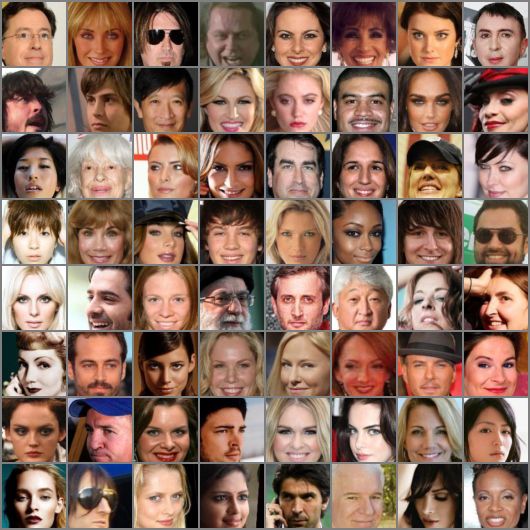

In [11]:
# We can use an image folder dataset the way we have it setup.
# Create the dataset
dataset = dset.ImageFolder(root=dataroot,
                           transform=transforms.Compose([
                               transforms.CenterCrop(116),
                               transforms.Resize(image_resolution),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))

# Create the dataloader
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=2)

# Plot some training images
data = next(iter(dataloader))

print(f'data shape: {data[0].shape}')
print(f'data max: {data[0].max()} min: {data[0].min()}')

grid = make_grid(data[0], nrow = 8)
display(to_pil_image(grid.add(1).div(2)))

## Implementation Generator and Discriminator

With our input parameters set and the dataset prepared, we can now get into the implementint the generator and the discriminator.

The discriminator $D$ makes a binary classification that takes an image as input and outputs a scalar probability indicating the input image is real or fake. The generator $G$ is designed to map a latent space vector ($z$) to an image. They are very similar to the encoder and the decoder we have seen in the VAE.   

One difference is that we'll be using [stride convolutions](https://medium.com/swlh/convolutional-neural-networks-part-2-padding-and-strided-convolutions-c63c25026eaa) and [transposed convolution](https://www.geeksforgeeks.org/what-is-transposed-convolutional-layer/) to scale up/ shrink down the tensor size instead of `MaxPooling` and `UpSampling`. In this way, the model learns its own pooling and upsampling function. Another difference is that each convolutional layer is followed by a [batch norm function](https://pytorch.org/docs/stable/generated/torch.nn.BatchNorm2d.html#torch.nn.BatchNorm2d).

In [15]:
from models import StrideConv2D

class Generator(nn.Module):
    def __init__(self, resolution, z_dim, c_base, colour_channels):
        super(Generator, self).__init__()

        self.resolution      = resolution
        self.z_dim           = z_dim
        self.colour_channels = colour_channels

        self.main = nn.Sequential(
            # [Batch, z_dim, 1, 1] -> [Batch, c_base*8, 4, 4]
            StrideConv2D(z_dim,    c_base*8, transpose = True, stride = 1, padding = 0),

            # [Batch, c_base*8, 4, 4] -> [Batch, c_base*8, 8, 8]
            StrideConv2D(c_base*8, c_base*8, transpose = True, stride = 2, padding = 1),

            # [Batch, c_base*8, 8, 8] -> [Batch, c_base*4, 16, 16]
            StrideConv2D(c_base*8, c_base*4, transpose = True, stride = 2, padding = 1),

            # [Batch, c_base*4, 16, 16] -> [Batch, c_base*2, 32, 32]
            StrideConv2D(c_base*4, c_base*2, transpose = True, stride = 2, padding = 1),

            # [Batch, c_base*2, 32, 32] -> [Batch, c_base, 64, 64]
            StrideConv2D(c_base*2, c_base*1, transpose = True, stride = 2, padding = 1),

            # [Batch, z_dim, 64, 64] -> [Batch, colour_channels, 64, 64]
            nn.Conv2d(c_base*1, colour_channels, kernel_size = 3, stride = 1, padding = 1),

            nn.Tanh()
        )

    def forward(self, x):

        assert x.dim() == 2, f'input dimension should be [Batch, z_dim], got {x.shape}'
        assert x.shape[1] == self.z_dim, f'input shape {x.shape} at index 1 doesnt match expected {self.z_dim}'

        x = x.unsqueeze(2).unsqueeze(3)
        return self.main(x)

class Discriminator(nn.Module):
    def __init__(self, resolution, c_base, colour_channels):
        super(Discriminator, self).__init__()
        self.resolution = resolution
        self.colour_channels = colour_channels

        self.main = nn.Sequential(

            # [Batch, colour_c, 64, 64] -> [Batch, c_base, 64, 64]
            nn.Conv2d(colour_channels, c_base, kernel_size = 3, stride = 1, padding = 1),

            # [Batch, c_base, 64, 64] -> [Batch, c_base*2, 32, 32]
            StrideConv2D(c_base, c_base*2, stride = 2, padding = 1, batch_norm = False),

            # [Batch, c_base*2, 32, 32] -> [Batch, c_base*4, 16, 16]
            StrideConv2D(c_base*2, c_base*4, stride = 2, padding = 1),

            # [Batch, c_base*4, 16, 16] -> [Batch, c_base*8, 8, 8]
            StrideConv2D(c_base*4, c_base*8, stride = 2, padding = 1),

            # [Batch, c_base*8, 8, 8] -> [Batch, c_base*8, 4, 4]
            StrideConv2D(c_base*8, c_base*8, stride = 2, padding = 1),

            # [Batch, c_base*8, 4, 4] -> [Batch, 1, 1, 1]
            StrideConv2D(c_base*8, 1, stride = 1, padding = 0, activation = False, batch_norm = False),

            nn.Sigmoid()
        )

    def forward(self, x):
        assert x.shape[1] == self.colour_channels, f'input shape {x.shape} at index 1 doesnt match expected {self.colour_channels}'

        return self.main(x).squeeze()

Initialising the generator and discriminator as netG and netD

In [16]:
# Create the generator
netG = Generator(resolution = image_resolution,
                 z_dim = z_dim,
                 c_base = c_base,
                 colour_channels = colour_channels).to(device)

# Create the discriminator
netD = Discriminator(resolution = image_resolution,
                     c_base = c_base,
                     colour_channels = colour_channels).to(device)

# Print the model
print(netG)
print(netD)

Generator(
  (main): Sequential(
    (0): StrideConv2D(
      (convolutions): ModuleList(
        (0): ConvTranspose2d(100, 256, kernel_size=(4, 4), stride=(1, 1), bias=False)
        (1): LeakyReLU(negative_slope=0.01)
        (2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
    )
    (1): StrideConv2D(
      (convolutions): ModuleList(
        (0): ConvTranspose2d(256, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
        (1): LeakyReLU(negative_slope=0.01)
        (2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
    )
    (2): StrideConv2D(
      (convolutions): ModuleList(
        (0): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
        (1): LeakyReLU(negative_slope=0.01)
        (2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
    )
    (3): StrideConv2D(
      (convolutions): Modul

In [17]:
# set this to the path to your checkpoint
checkpoint_path = ''

if checkpoint_path:
    checkpoint_sd = torch.load(checkpoint_path, map_location=torch.device('cpu'))
    netG.load_state_dict(checkpoint_sd['generator'])
    netD.load_state_dict(checkpoint_sd['discriminator'])

## Loss Functions and Optimizers

With $D$ and $G$ setup, we can specify how they learn through the loss
functions and optimizers. We will use the Binary Cross Entropy loss
([BCELoss](https://pytorch.org/docs/stable/generated/torch.nn.BCELoss.html#torch.nn.BCELoss)) for binary classification task.

Next, we define our real label as 1 and the fake label as 0. These
labels will be used when calculating the losses of $D$ and $G$, and this
is also the convention used in the original GAN paper. Finally, we set
up two separate optimizers, one for $D$ and one for $G$. As specified in
the DCGAN paper, both are Adam optimizers with `learning_rate = 0.0002` and
`Beta1 = 0.5`.


In [18]:
# Create the generator
netG = Generator(resolution = image_resolution,
                 z_dim = z_dim,
                 c_base = c_base,
                 colour_channels = colour_channels).to(device)

# Create the discriminator
netD = Discriminator(resolution = image_resolution,
                     c_base = c_base,
                     colour_channels = colour_channels).to(device)

# Initialise the ``BCELoss`` function
criterion = nn.BCELoss()

# a fixed batch of latent vectors to visualise the training progress
test_latents = torch.randn(16, z_dim, device=device)

# convention for real and fake labels
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=0.0002, betas=(0.5, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=0.0002, betas=(0.5, 0.999))

## Training


#### Part 1 - Train the Discriminator

Recall, the goal of training the discriminator is to maximize the
probability of correctly classifying a given input as real or fake. First, we will construct a batch of real samples from
the training set, forward pass through $D$, calculate the loss, then optimise the discriminator.
Then, we will construct a batch of fake samples with the current
generator, forward pass this batch through $D$, calculate the loss, then optimise the discriminator again.
Now, the discriminator is updated by both the all-real and all-fake
batches, we call a step of the Discriminator's optimizer.

#### Part 2 - Train the Generator

We want to optimise the Generator in a way that the Discriminator predict as much real labels as possible. First, we create a batch of random latent vectors, forward pass it through $G$ to construct a batch of fake samples. Then, we forward pass these fake images through $D$, the loss for the Generator is calculated by using real labels as ground truth, and Discriminator's outputs as predictions.  

**Note:** This step might take a while, depending on how many epochs you run. But feel free to early stop it anytime you want. Saved models are at the `./checkpoints` folder


In [19]:
# create a directory to save the model checkpoints
if not os.path.exists('checkpoints'):
    os.makedirs('checkpoints')

Starting Training Loop...
[0/20][0/782]	Loss_D: 1.3184	Loss_G: 2.3744


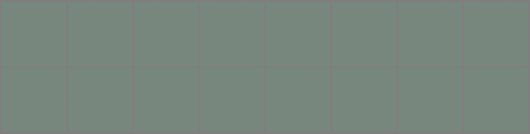

[0/20][50/782]	Loss_D: 0.0064	Loss_G: 7.4598
[0/20][100/782]	Loss_D: 0.0109	Loss_G: 8.9870
[0/20][150/782]	Loss_D: 0.0364	Loss_G: 5.6682
[0/20][200/782]	Loss_D: 0.2171	Loss_G: 3.5221
[0/20][250/782]	Loss_D: 0.6398	Loss_G: 7.7825


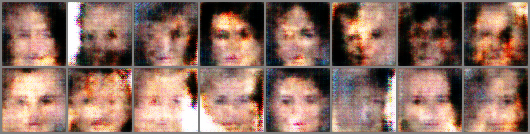

[0/20][300/782]	Loss_D: 1.2474	Loss_G: 6.6365
[0/20][350/782]	Loss_D: 0.3090	Loss_G: 2.8926
[0/20][400/782]	Loss_D: 0.2764	Loss_G: 3.5571
[0/20][450/782]	Loss_D: 0.4064	Loss_G: 6.6888
[0/20][500/782]	Loss_D: 0.3752	Loss_G: 3.2637


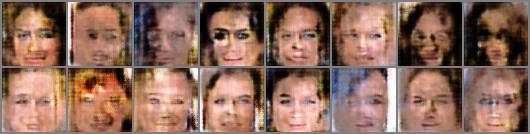

[0/20][550/782]	Loss_D: 0.2584	Loss_G: 4.5179
[0/20][600/782]	Loss_D: 0.4198	Loss_G: 2.5064
[0/20][650/782]	Loss_D: 0.2196	Loss_G: 4.2067
[0/20][700/782]	Loss_D: 0.3669	Loss_G: 4.1161
[0/20][750/782]	Loss_D: 0.4174	Loss_G: 2.5908


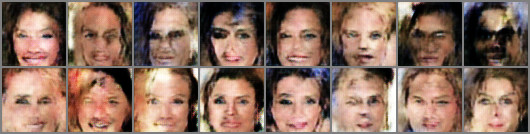

[1/20][0/782]	Loss_D: 0.7346	Loss_G: 8.2787


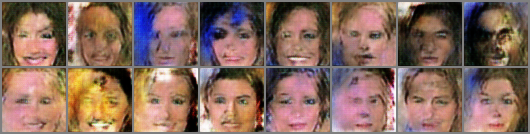

[1/20][50/782]	Loss_D: 0.2380	Loss_G: 5.0702
[1/20][100/782]	Loss_D: 0.3199	Loss_G: 5.0633
[1/20][150/782]	Loss_D: 0.2517	Loss_G: 4.0774
[1/20][200/782]	Loss_D: 0.3622	Loss_G: 4.2746
[1/20][250/782]	Loss_D: 0.3268	Loss_G: 4.2811


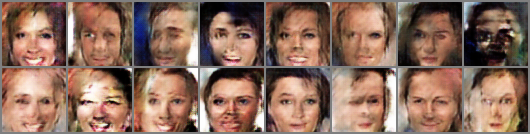

[1/20][300/782]	Loss_D: 0.2734	Loss_G: 3.4302
[1/20][350/782]	Loss_D: 0.5723	Loss_G: 2.3397
[1/20][400/782]	Loss_D: 0.3476	Loss_G: 3.3258
[1/20][450/782]	Loss_D: 0.7380	Loss_G: 6.4508
[1/20][500/782]	Loss_D: 0.7090	Loss_G: 7.6206


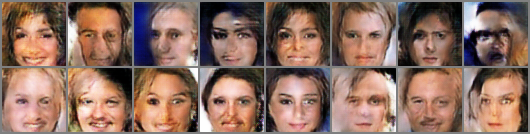

[1/20][550/782]	Loss_D: 1.6245	Loss_G: 8.9171
[1/20][600/782]	Loss_D: 0.1431	Loss_G: 5.6513
[1/20][650/782]	Loss_D: 0.4787	Loss_G: 4.8571
[1/20][700/782]	Loss_D: 0.2028	Loss_G: 5.1200
[1/20][750/782]	Loss_D: 0.2710	Loss_G: 4.7408


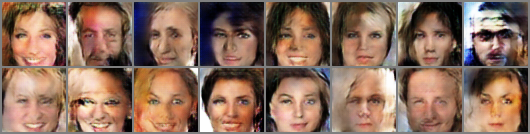

[2/20][0/782]	Loss_D: 1.4864	Loss_G: 11.3228


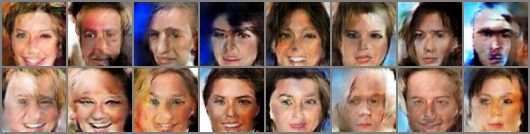

[2/20][50/782]	Loss_D: 0.2453	Loss_G: 4.0063
[2/20][100/782]	Loss_D: 0.5288	Loss_G: 6.6604
[2/20][150/782]	Loss_D: 0.2807	Loss_G: 3.5153
[2/20][200/782]	Loss_D: 0.3006	Loss_G: 3.3457
[2/20][250/782]	Loss_D: 0.1243	Loss_G: 4.6361


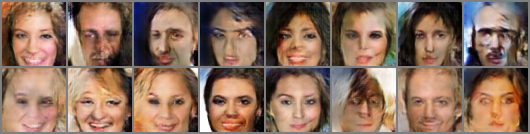

[2/20][300/782]	Loss_D: 1.3806	Loss_G: 10.3083
[2/20][350/782]	Loss_D: 0.3117	Loss_G: 5.1591
[2/20][400/782]	Loss_D: 1.0267	Loss_G: 9.3471
[2/20][450/782]	Loss_D: 0.5301	Loss_G: 4.8846
[2/20][500/782]	Loss_D: 0.4477	Loss_G: 2.2520


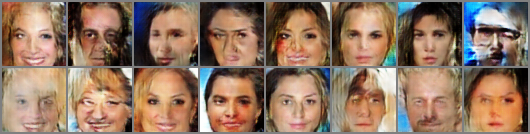

[2/20][550/782]	Loss_D: 0.2825	Loss_G: 3.9964
[2/20][600/782]	Loss_D: 1.5890	Loss_G: 4.2074
[2/20][650/782]	Loss_D: 0.2456	Loss_G: 4.9752
[2/20][700/782]	Loss_D: 0.3952	Loss_G: 4.4994
[2/20][750/782]	Loss_D: 0.4272	Loss_G: 4.2401


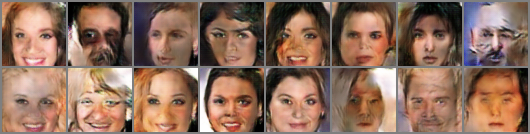

[3/20][0/782]	Loss_D: 0.9576	Loss_G: 6.9881


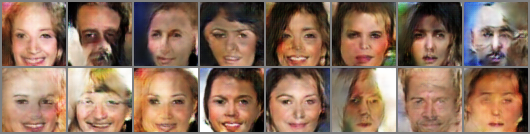

[3/20][50/782]	Loss_D: 0.3279	Loss_G: 4.6820
[3/20][100/782]	Loss_D: 0.2195	Loss_G: 5.1586
[3/20][150/782]	Loss_D: 1.2800	Loss_G: 0.8687
[3/20][200/782]	Loss_D: 0.3940	Loss_G: 6.7583
[3/20][250/782]	Loss_D: 0.4344	Loss_G: 8.6777


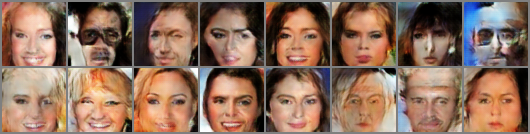

[3/20][300/782]	Loss_D: 0.2451	Loss_G: 4.4254
[3/20][350/782]	Loss_D: 0.2223	Loss_G: 4.4315
[3/20][400/782]	Loss_D: 0.1891	Loss_G: 4.4322
[3/20][450/782]	Loss_D: 0.2603	Loss_G: 4.2449
[3/20][500/782]	Loss_D: 0.2342	Loss_G: 4.1218


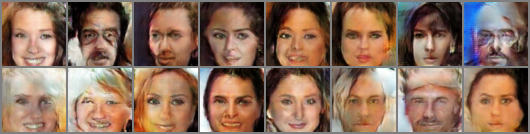

[3/20][550/782]	Loss_D: 0.2548	Loss_G: 5.6211
[3/20][600/782]	Loss_D: 0.5853	Loss_G: 6.1402
[3/20][650/782]	Loss_D: 0.3396	Loss_G: 3.7056
[3/20][700/782]	Loss_D: 0.3168	Loss_G: 4.1588
[3/20][750/782]	Loss_D: 0.3240	Loss_G: 3.4048


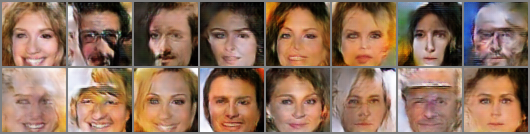

[4/20][0/782]	Loss_D: 1.9998	Loss_G: 10.9996


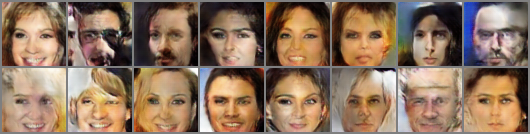

[4/20][50/782]	Loss_D: 0.2741	Loss_G: 2.9397
[4/20][100/782]	Loss_D: 0.1576	Loss_G: 4.6985
[4/20][150/782]	Loss_D: 0.2193	Loss_G: 3.5454
[4/20][200/782]	Loss_D: 0.1699	Loss_G: 5.1067
[4/20][250/782]	Loss_D: 0.7304	Loss_G: 7.4328


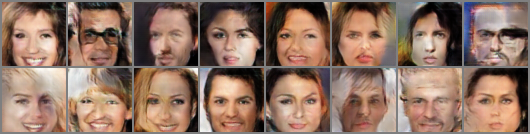

[4/20][300/782]	Loss_D: 0.1624	Loss_G: 3.9682
[4/20][350/782]	Loss_D: 0.3279	Loss_G: 6.4523
[4/20][400/782]	Loss_D: 0.2506	Loss_G: 6.3261
[4/20][450/782]	Loss_D: 0.1652	Loss_G: 3.9519
[4/20][500/782]	Loss_D: 0.2492	Loss_G: 4.3335


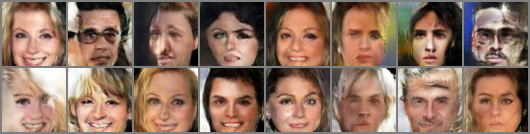

[4/20][550/782]	Loss_D: 0.2325	Loss_G: 4.2931
[4/20][600/782]	Loss_D: 0.6457	Loss_G: 7.4191
[4/20][650/782]	Loss_D: 0.2537	Loss_G: 4.7981
[4/20][700/782]	Loss_D: 0.1634	Loss_G: 5.4813
[4/20][750/782]	Loss_D: 0.3321	Loss_G: 6.2396


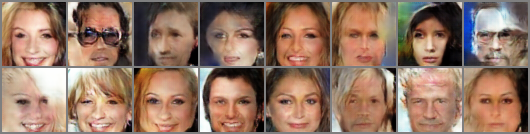

[5/20][0/782]	Loss_D: 0.6944	Loss_G: 6.6404


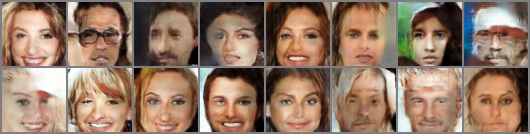

[5/20][50/782]	Loss_D: 0.4686	Loss_G: 2.8102
[5/20][100/782]	Loss_D: 0.2082	Loss_G: 6.2434
[5/20][150/782]	Loss_D: 0.0836	Loss_G: 5.1627
[5/20][200/782]	Loss_D: 0.2398	Loss_G: 4.4382
[5/20][250/782]	Loss_D: 0.7078	Loss_G: 9.6400


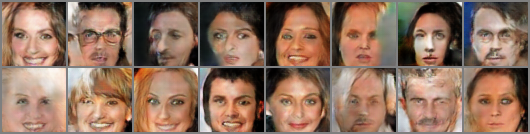

[5/20][300/782]	Loss_D: 0.0513	Loss_G: 5.0193
[5/20][350/782]	Loss_D: 1.4880	Loss_G: 14.2785
[5/20][400/782]	Loss_D: 0.2793	Loss_G: 4.6504
[5/20][450/782]	Loss_D: 0.2014	Loss_G: 5.8008
[5/20][500/782]	Loss_D: 0.2474	Loss_G: 4.5645


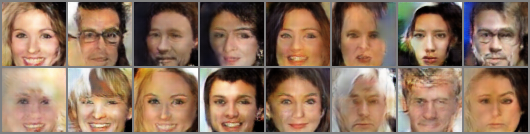

[5/20][550/782]	Loss_D: 1.3305	Loss_G: 10.3286
[5/20][600/782]	Loss_D: 0.1946	Loss_G: 5.4106
[5/20][650/782]	Loss_D: 0.2274	Loss_G: 5.5584
[5/20][700/782]	Loss_D: 1.0679	Loss_G: 11.7561
[5/20][750/782]	Loss_D: 0.6691	Loss_G: 3.2615


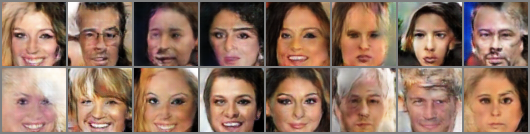

[6/20][0/782]	Loss_D: 1.0441	Loss_G: 9.9525


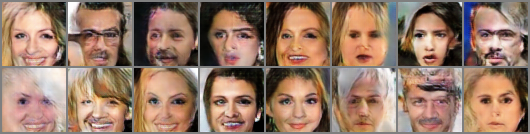

[6/20][50/782]	Loss_D: 0.2971	Loss_G: 7.2362
[6/20][100/782]	Loss_D: 0.2949	Loss_G: 6.7292
[6/20][150/782]	Loss_D: 0.1913	Loss_G: 7.5998
[6/20][200/782]	Loss_D: 0.1504	Loss_G: 4.5733
[6/20][250/782]	Loss_D: 0.1383	Loss_G: 7.0859


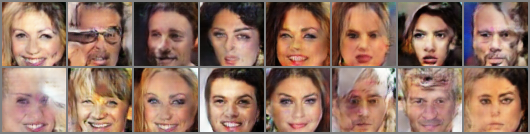

[6/20][300/782]	Loss_D: 0.4329	Loss_G: 1.9683
[6/20][350/782]	Loss_D: 0.1131	Loss_G: 5.9325
[6/20][400/782]	Loss_D: 0.1970	Loss_G: 4.9312
[6/20][450/782]	Loss_D: 1.6143	Loss_G: 11.0925
[6/20][500/782]	Loss_D: 0.3131	Loss_G: 7.9817


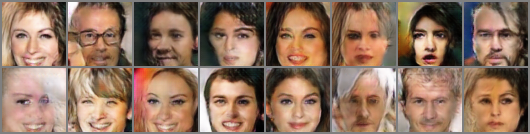

[6/20][550/782]	Loss_D: 0.2126	Loss_G: 6.8075
[6/20][600/782]	Loss_D: 0.2647	Loss_G: 5.0384
[6/20][650/782]	Loss_D: 0.2681	Loss_G: 3.8599
[6/20][700/782]	Loss_D: 0.2127	Loss_G: 4.0588
[6/20][750/782]	Loss_D: 0.0853	Loss_G: 6.6095


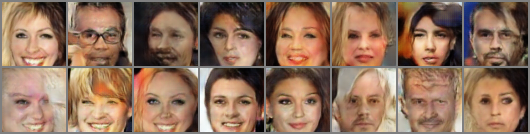

[7/20][0/782]	Loss_D: 0.6262	Loss_G: 9.1484


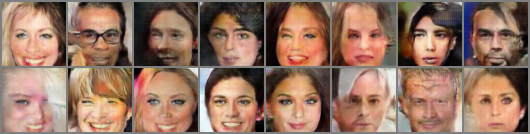

[7/20][50/782]	Loss_D: 0.1490	Loss_G: 5.0059
[7/20][100/782]	Loss_D: 0.2016	Loss_G: 6.4078
[7/20][150/782]	Loss_D: 0.3501	Loss_G: 3.3939
[7/20][200/782]	Loss_D: 0.0999	Loss_G: 5.9441
[7/20][250/782]	Loss_D: 0.1155	Loss_G: 5.1078


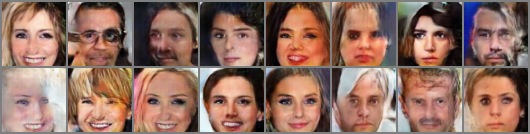

[7/20][300/782]	Loss_D: 0.1314	Loss_G: 4.4094
[7/20][350/782]	Loss_D: 0.1696	Loss_G: 8.9210
[7/20][400/782]	Loss_D: 0.4678	Loss_G: 2.4306
[7/20][450/782]	Loss_D: 0.1459	Loss_G: 8.9403
[7/20][500/782]	Loss_D: 0.0603	Loss_G: 6.7444


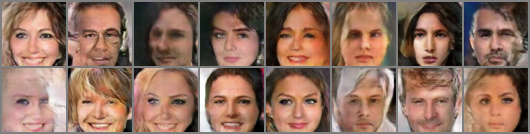

[7/20][550/782]	Loss_D: 0.2241	Loss_G: 3.3504
[7/20][600/782]	Loss_D: 0.2165	Loss_G: 5.0658
[7/20][650/782]	Loss_D: 0.0674	Loss_G: 5.8770
[7/20][700/782]	Loss_D: 0.4328	Loss_G: 9.9094
[7/20][750/782]	Loss_D: 0.2006	Loss_G: 6.4665


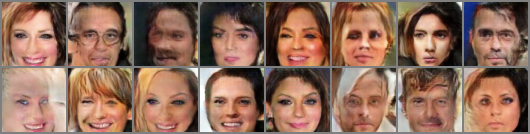

[8/20][0/782]	Loss_D: 0.0788	Loss_G: 5.8892


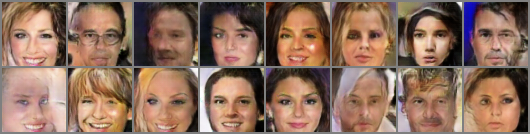

[8/20][50/782]	Loss_D: 0.1651	Loss_G: 6.4068
[8/20][100/782]	Loss_D: 0.5085	Loss_G: 10.6618
[8/20][150/782]	Loss_D: 0.0489	Loss_G: 8.3896
[8/20][200/782]	Loss_D: 0.1371	Loss_G: 6.7598
[8/20][250/782]	Loss_D: 0.1754	Loss_G: 4.4699


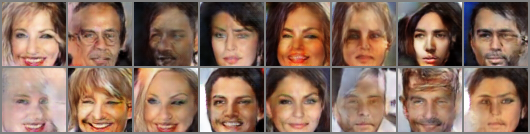

[8/20][300/782]	Loss_D: 0.1543	Loss_G: 6.2255
[8/20][350/782]	Loss_D: 0.6605	Loss_G: 10.9102
[8/20][400/782]	Loss_D: 0.1087	Loss_G: 6.7260
[8/20][450/782]	Loss_D: 0.0989	Loss_G: 6.2531
[8/20][500/782]	Loss_D: 0.0824	Loss_G: 6.3733


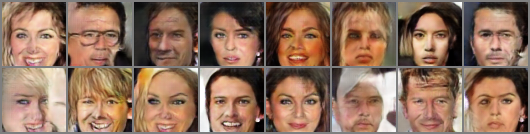

[8/20][550/782]	Loss_D: 0.1127	Loss_G: 6.0058
[8/20][600/782]	Loss_D: 1.0886	Loss_G: 2.7484
[8/20][650/782]	Loss_D: 0.2101	Loss_G: 7.3811
[8/20][700/782]	Loss_D: 0.4910	Loss_G: 3.1673
[8/20][750/782]	Loss_D: 0.0934	Loss_G: 9.7502


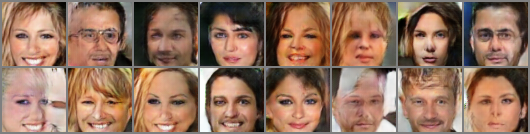

[9/20][0/782]	Loss_D: 0.0648	Loss_G: 4.3225


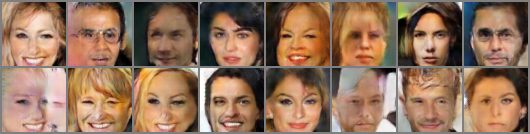

[9/20][50/782]	Loss_D: 0.1831	Loss_G: 4.6579
[9/20][100/782]	Loss_D: 0.0763	Loss_G: 6.1439
[9/20][150/782]	Loss_D: 0.0570	Loss_G: 6.1266
[9/20][200/782]	Loss_D: 0.4272	Loss_G: 11.0772
[9/20][250/782]	Loss_D: 0.0607	Loss_G: 6.0259


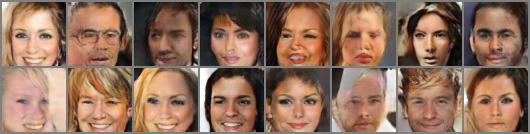

[9/20][300/782]	Loss_D: 0.0403	Loss_G: 6.2426
[9/20][350/782]	Loss_D: 0.4613	Loss_G: 4.4503
[9/20][400/782]	Loss_D: 0.0513	Loss_G: 7.4346
[9/20][450/782]	Loss_D: 0.0485	Loss_G: 5.7714
[9/20][500/782]	Loss_D: 0.4984	Loss_G: 9.2308


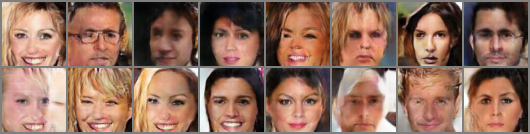

[9/20][550/782]	Loss_D: 0.1525	Loss_G: 4.0191
[9/20][600/782]	Loss_D: 1.0798	Loss_G: 17.2596
[9/20][650/782]	Loss_D: 0.1893	Loss_G: 5.7347
[9/20][700/782]	Loss_D: 0.0736	Loss_G: 6.6119
[9/20][750/782]	Loss_D: 0.0788	Loss_G: 9.0067


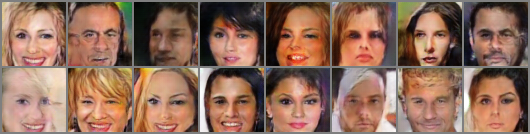

[10/20][0/782]	Loss_D: 0.0149	Loss_G: 5.8097


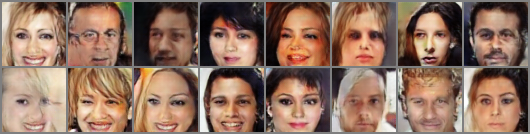

[10/20][50/782]	Loss_D: 0.1103	Loss_G: 5.5137
[10/20][100/782]	Loss_D: 0.0680	Loss_G: 5.7923
[10/20][150/782]	Loss_D: 0.3599	Loss_G: 3.6079
[10/20][200/782]	Loss_D: 3.3848	Loss_G: 1.0606
[10/20][250/782]	Loss_D: 0.0605	Loss_G: 7.8341


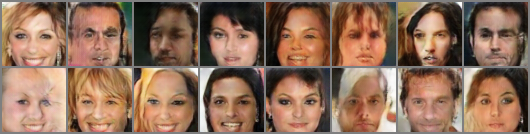

[10/20][300/782]	Loss_D: 0.5176	Loss_G: 12.3702
[10/20][350/782]	Loss_D: 0.1030	Loss_G: 5.6529
[10/20][400/782]	Loss_D: 0.0249	Loss_G: 6.8684
[10/20][450/782]	Loss_D: 0.2460	Loss_G: 2.9875
[10/20][500/782]	Loss_D: 0.2616	Loss_G: 9.7922


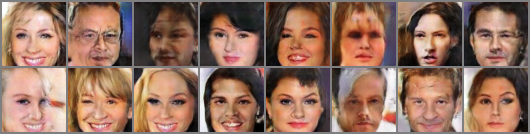

[10/20][550/782]	Loss_D: 0.2821	Loss_G: 10.6126
[10/20][600/782]	Loss_D: 0.3860	Loss_G: 10.8255
[10/20][650/782]	Loss_D: 0.6535	Loss_G: 3.0154
[10/20][700/782]	Loss_D: 0.1678	Loss_G: 5.7704
[10/20][750/782]	Loss_D: 0.6073	Loss_G: 13.6064


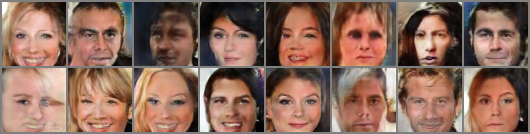

[11/20][0/782]	Loss_D: 0.0115	Loss_G: 10.2041


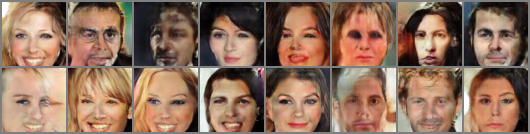

[11/20][50/782]	Loss_D: 0.4784	Loss_G: 4.3935
[11/20][100/782]	Loss_D: 0.0723	Loss_G: 6.2196
[11/20][150/782]	Loss_D: 0.1029	Loss_G: 6.0609
[11/20][200/782]	Loss_D: 0.0321	Loss_G: 5.8993
[11/20][250/782]	Loss_D: 0.0644	Loss_G: 6.4225


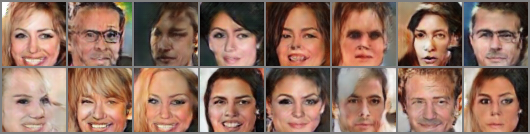

[11/20][300/782]	Loss_D: 0.0743	Loss_G: 6.4978
[11/20][350/782]	Loss_D: 0.0541	Loss_G: 8.1169
[11/20][400/782]	Loss_D: 0.0938	Loss_G: 6.5427
[11/20][450/782]	Loss_D: 0.0330	Loss_G: 7.5368
[11/20][500/782]	Loss_D: 0.1342	Loss_G: 3.8396


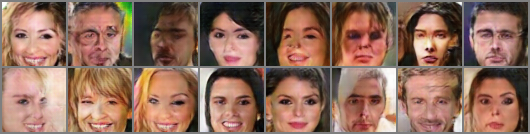

[11/20][550/782]	Loss_D: 0.1851	Loss_G: 7.3146
[11/20][600/782]	Loss_D: 0.0190	Loss_G: 7.6155
[11/20][650/782]	Loss_D: 0.0506	Loss_G: 6.8896
[11/20][700/782]	Loss_D: 0.1250	Loss_G: 7.0714
[11/20][750/782]	Loss_D: 0.0836	Loss_G: 6.0138


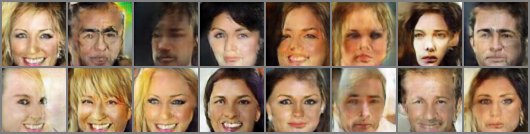

[12/20][0/782]	Loss_D: 1.8035	Loss_G: 15.7853


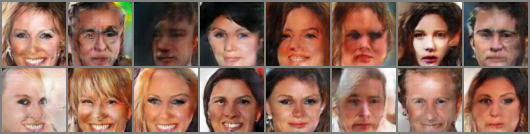

[12/20][50/782]	Loss_D: 1.9869	Loss_G: 2.3560
[12/20][100/782]	Loss_D: 0.0836	Loss_G: 7.1977
[12/20][150/782]	Loss_D: 0.0375	Loss_G: 6.9005
[12/20][200/782]	Loss_D: 0.0286	Loss_G: 6.8584
[12/20][250/782]	Loss_D: 0.0763	Loss_G: 7.4275


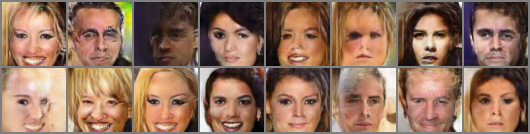

[12/20][300/782]	Loss_D: 0.2021	Loss_G: 5.8660
[12/20][350/782]	Loss_D: 0.4495	Loss_G: 11.3360
[12/20][400/782]	Loss_D: 0.1180	Loss_G: 7.1289
[12/20][450/782]	Loss_D: 0.1299	Loss_G: 6.1674
[12/20][500/782]	Loss_D: 0.0391	Loss_G: 6.8952


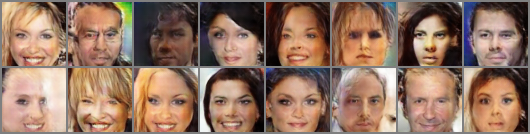

[12/20][550/782]	Loss_D: 0.0280	Loss_G: 6.2383
[12/20][600/782]	Loss_D: 0.0505	Loss_G: 6.7324
[12/20][650/782]	Loss_D: 0.0360	Loss_G: 7.1541
[12/20][700/782]	Loss_D: 0.0325	Loss_G: 8.0381
[12/20][750/782]	Loss_D: 0.1711	Loss_G: 6.7669


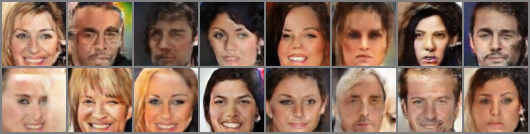

[13/20][0/782]	Loss_D: 4.6674	Loss_G: 17.3784


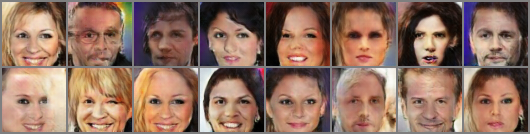

[13/20][50/782]	Loss_D: 0.0566	Loss_G: 5.8941
[13/20][100/782]	Loss_D: 0.0364	Loss_G: 5.8974
[13/20][150/782]	Loss_D: 0.1221	Loss_G: 6.9105
[13/20][200/782]	Loss_D: 0.0360	Loss_G: 6.5428
[13/20][250/782]	Loss_D: 0.0553	Loss_G: 6.0414


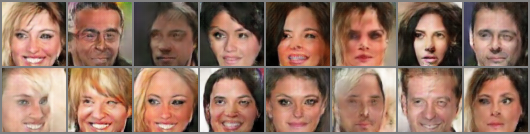

[13/20][300/782]	Loss_D: 0.1448	Loss_G: 8.5219
[13/20][350/782]	Loss_D: 0.0781	Loss_G: 6.6893
[13/20][400/782]	Loss_D: 0.0988	Loss_G: 6.2443
[13/20][450/782]	Loss_D: 0.0542	Loss_G: 6.0150
[13/20][500/782]	Loss_D: 0.0732	Loss_G: 5.4246


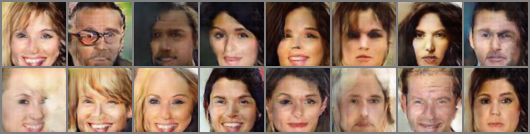

[13/20][550/782]	Loss_D: 0.2357	Loss_G: 6.0916
[13/20][600/782]	Loss_D: 0.0171	Loss_G: 6.9468
[13/20][650/782]	Loss_D: 0.3550	Loss_G: 5.5958
[13/20][700/782]	Loss_D: 0.0327	Loss_G: 6.6160
[13/20][750/782]	Loss_D: 0.1079	Loss_G: 7.2639


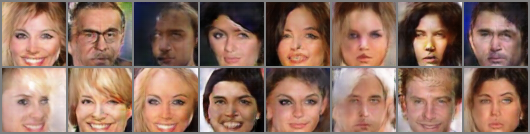

[14/20][0/782]	Loss_D: 0.0610	Loss_G: 6.7114


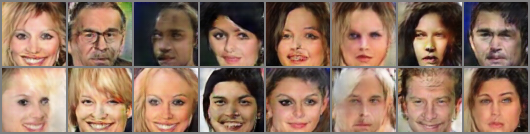

[14/20][50/782]	Loss_D: 0.0528	Loss_G: 6.5510
[14/20][100/782]	Loss_D: 0.0610	Loss_G: 6.3013
[14/20][150/782]	Loss_D: 0.0778	Loss_G: 8.6217
[14/20][200/782]	Loss_D: 0.0292	Loss_G: 6.8856
[14/20][250/782]	Loss_D: 0.0385	Loss_G: 6.7820


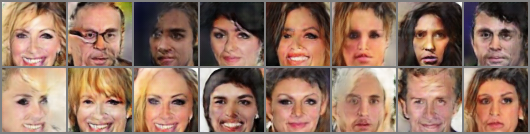

[14/20][300/782]	Loss_D: 0.0604	Loss_G: 6.9181
[14/20][350/782]	Loss_D: 0.0814	Loss_G: 6.7688
[14/20][400/782]	Loss_D: 0.0330	Loss_G: 6.8957
[14/20][450/782]	Loss_D: 0.0304	Loss_G: 7.2556
[14/20][500/782]	Loss_D: 0.1184	Loss_G: 5.2658


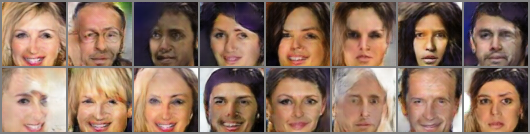

[14/20][550/782]	Loss_D: 0.0708	Loss_G: 8.2289
[14/20][600/782]	Loss_D: 0.1465	Loss_G: 13.5338
[14/20][650/782]	Loss_D: 0.0707	Loss_G: 10.7162
[14/20][700/782]	Loss_D: 0.0584	Loss_G: 6.3589
[14/20][750/782]	Loss_D: 0.1925	Loss_G: 9.1634


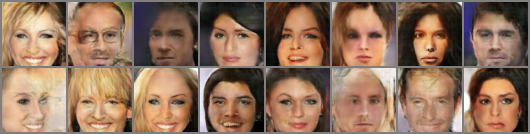

[15/20][0/782]	Loss_D: 0.0891	Loss_G: 6.2986


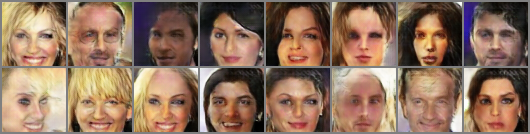

[15/20][50/782]	Loss_D: 0.0254	Loss_G: 7.7708
[15/20][100/782]	Loss_D: 0.0289	Loss_G: 6.3722
[15/20][150/782]	Loss_D: 0.0401	Loss_G: 6.3094
[15/20][200/782]	Loss_D: 0.0338	Loss_G: 6.7109
[15/20][250/782]	Loss_D: 0.1330	Loss_G: 12.0114


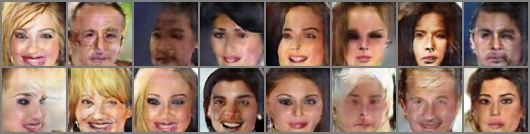

[15/20][300/782]	Loss_D: 0.0266	Loss_G: 6.9023
[15/20][350/782]	Loss_D: 0.0323	Loss_G: 6.2323
[15/20][400/782]	Loss_D: 0.0771	Loss_G: 6.1471
[15/20][450/782]	Loss_D: 0.1302	Loss_G: 7.6017
[15/20][500/782]	Loss_D: 0.1069	Loss_G: 7.0540


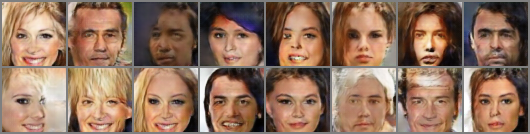

[15/20][550/782]	Loss_D: 0.0197	Loss_G: 8.3498
[15/20][600/782]	Loss_D: 0.0086	Loss_G: 6.4200
[15/20][650/782]	Loss_D: 0.0940	Loss_G: 6.3611
[15/20][700/782]	Loss_D: 0.0348	Loss_G: 10.1114
[15/20][750/782]	Loss_D: 0.0238	Loss_G: 6.8454


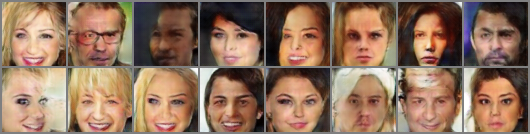

[16/20][0/782]	Loss_D: 0.1285	Loss_G: 9.6272


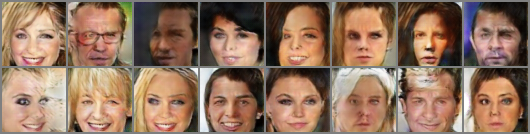

[16/20][50/782]	Loss_D: 0.0439	Loss_G: 7.4265
[16/20][100/782]	Loss_D: 2.2169	Loss_G: 17.4916
[16/20][150/782]	Loss_D: 0.1366	Loss_G: 5.9408
[16/20][200/782]	Loss_D: 0.0545	Loss_G: 6.6056
[16/20][250/782]	Loss_D: 0.0492	Loss_G: 6.8216


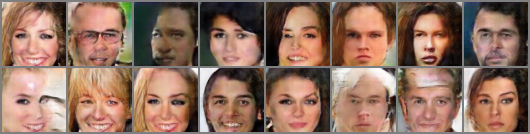

[16/20][300/782]	Loss_D: 0.0298	Loss_G: 6.7953
[16/20][350/782]	Loss_D: 0.0424	Loss_G: 7.5620
[16/20][400/782]	Loss_D: 0.0486	Loss_G: 7.2149
[16/20][450/782]	Loss_D: 0.0260	Loss_G: 7.4258
[16/20][500/782]	Loss_D: 0.1417	Loss_G: 11.5900


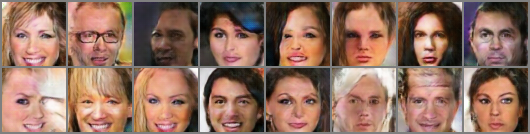

[16/20][550/782]	Loss_D: 0.3044	Loss_G: 11.4928
[16/20][600/782]	Loss_D: 0.0245	Loss_G: 7.2537
[16/20][650/782]	Loss_D: 0.1643	Loss_G: 7.0507
[16/20][700/782]	Loss_D: 0.0462	Loss_G: 6.6499
[16/20][750/782]	Loss_D: 0.0723	Loss_G: 7.3663


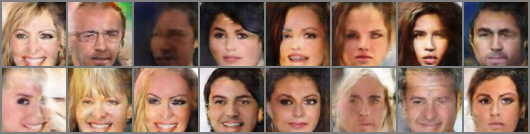

[17/20][0/782]	Loss_D: 0.1807	Loss_G: 6.7072


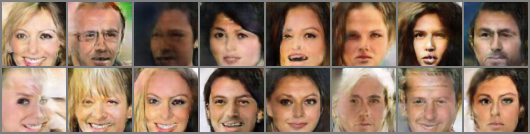

[17/20][50/782]	Loss_D: 0.0214	Loss_G: 7.4743
[17/20][100/782]	Loss_D: 0.0474	Loss_G: 6.3229
[17/20][150/782]	Loss_D: 0.0116	Loss_G: 8.2650
[17/20][200/782]	Loss_D: 0.0095	Loss_G: 8.1083
[17/20][250/782]	Loss_D: 0.0265	Loss_G: 8.7023


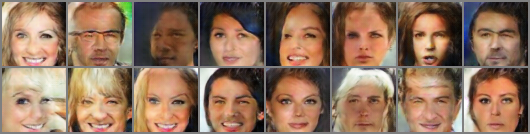

[17/20][300/782]	Loss_D: 0.0323	Loss_G: 10.5266
[17/20][350/782]	Loss_D: 0.4618	Loss_G: 13.3177
[17/20][400/782]	Loss_D: 0.1277	Loss_G: 6.1397
[17/20][450/782]	Loss_D: 0.0660	Loss_G: 7.3406
[17/20][500/782]	Loss_D: 0.0111	Loss_G: 9.3081


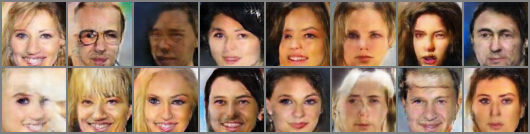

[17/20][550/782]	Loss_D: 0.0306	Loss_G: 5.9387
[17/20][600/782]	Loss_D: 0.0154	Loss_G: 8.7149
[17/20][650/782]	Loss_D: 0.0504	Loss_G: 7.2603
[17/20][700/782]	Loss_D: 0.3873	Loss_G: 2.1953
[17/20][750/782]	Loss_D: 0.1100	Loss_G: 5.8210


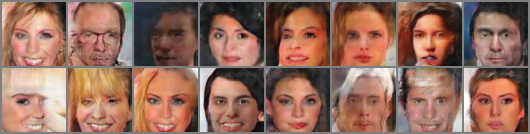

[18/20][0/782]	Loss_D: 0.0116	Loss_G: 7.0574


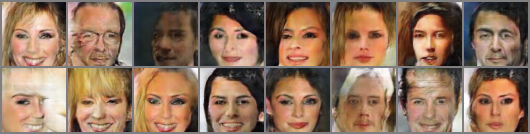

[18/20][50/782]	Loss_D: 0.0486	Loss_G: 6.1877
[18/20][100/782]	Loss_D: 0.3084	Loss_G: 9.6224
[18/20][150/782]	Loss_D: 0.0136	Loss_G: 8.1644
[18/20][200/782]	Loss_D: 0.0333	Loss_G: 6.5902
[18/20][250/782]	Loss_D: 0.1367	Loss_G: 5.8675


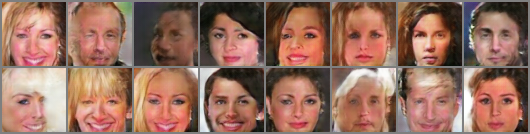

[18/20][300/782]	Loss_D: 0.1190	Loss_G: 5.6229
[18/20][350/782]	Loss_D: 0.0314	Loss_G: 9.1032
[18/20][400/782]	Loss_D: 0.1079	Loss_G: 9.8089
[18/20][450/782]	Loss_D: 0.0265	Loss_G: 6.6493
[18/20][500/782]	Loss_D: 0.0680	Loss_G: 6.7958


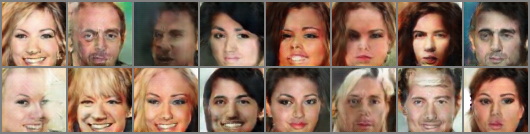

[18/20][550/782]	Loss_D: 0.0738	Loss_G: 5.0887
[18/20][600/782]	Loss_D: 0.0945	Loss_G: 6.9983
[18/20][650/782]	Loss_D: 0.1856	Loss_G: 4.8793
[18/20][700/782]	Loss_D: 0.0901	Loss_G: 7.4540
[18/20][750/782]	Loss_D: 0.0609	Loss_G: 7.6395


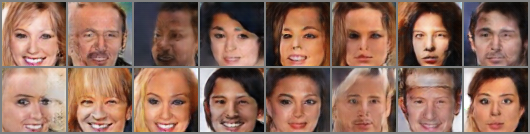

[19/20][0/782]	Loss_D: 0.1055	Loss_G: 6.1553


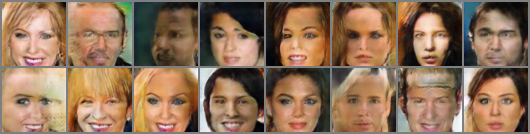

[19/20][50/782]	Loss_D: 0.0353	Loss_G: 8.5518
[19/20][100/782]	Loss_D: 0.0117	Loss_G: 4.9678
[19/20][150/782]	Loss_D: 0.0810	Loss_G: 5.8471
[19/20][200/782]	Loss_D: 0.0214	Loss_G: 6.4692
[19/20][250/782]	Loss_D: 0.0210	Loss_G: 7.4202


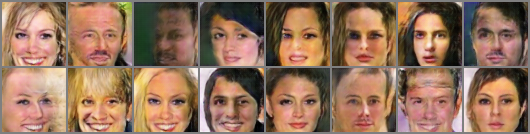

[19/20][300/782]	Loss_D: 0.0505	Loss_G: 7.4862
[19/20][350/782]	Loss_D: 0.0383	Loss_G: 7.1993
[19/20][400/782]	Loss_D: 0.0518	Loss_G: 7.3269
[19/20][450/782]	Loss_D: 0.2367	Loss_G: 10.8307
[19/20][500/782]	Loss_D: 0.0111	Loss_G: 8.8935


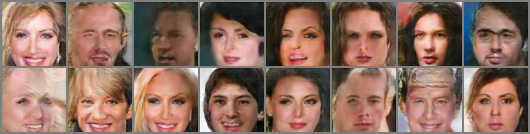

[19/20][550/782]	Loss_D: 0.0155	Loss_G: 7.7807
[19/20][600/782]	Loss_D: 0.0701	Loss_G: 6.0251
[19/20][650/782]	Loss_D: 0.0578	Loss_G: 8.2502
[19/20][700/782]	Loss_D: 0.0722	Loss_G: 8.4757
[19/20][750/782]	Loss_D: 0.0429	Loss_G: 6.5594


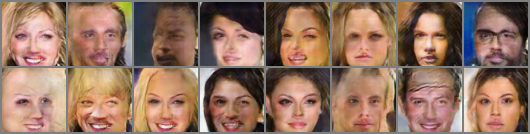

In [20]:
# Training Loop

print_every = 50
save_and_display_every = 250

# Lists to keep track of progress
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):

    #---- Training loop -----------------------------

    for i, data in enumerate(dataloader, 0):

        netG.train()
        netD.train()

        #------- Train discriminator on real images---------
        netD.zero_grad()

        # Load: The training data loader loads a batch of training data and their true class labels.
        real_imgs = data[0].to(device)
        minibatch_size = real_imgs.size(0)
        real_labels = torch.full((minibatch_size,), real_label, dtype=torch.float, device=device)\

        # Forward pass real batch through D
        output = netD(real_imgs).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, real_labels)
        # Calculate gradients for D in backward pass
        errD_real.backward()


        #------- Train discriminator on fake images---------

        # Generate batch of latent vectors
        latents = torch.randn(minibatch_size, z_dim, device=device)
        # Generate fake image batch with G
        fake_imgs = netG(latents)
        # Create a batch of labels for fake images
        fake_labels = torch.full((minibatch_size,), fake_label, dtype=torch.float, device=device)

        # Classify all fake batch with D
        pred_labels = netD(fake_imgs.detach())
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(pred_labels, fake_labels)
        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        errD_fake.backward()

        # Compute error of D as sum over the fake and the real batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()


        #------- Train generator on the discriminator's predictions----

        netG.zero_grad()
        real_labels = torch.full((minibatch_size,), real_label, dtype=torch.float, device=device)
        # label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        pred_labels = netD(fake_imgs)
        # Calculate G's loss based on this output
        errG = criterion(pred_labels, real_labels)
        # Calculate gradients for G
        errG.backward()

        # Update G
        optimizerG.step()

        # Output training stats
        if i % print_every == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f'
                  % (epoch, num_epochs, i, len(dataloader), errD.item(), errG.item()))

        if i % save_and_display_every == 0:
            netG.eval()
            netD.eval()

            with torch.inference_mode():
                generation = netG(test_latents)

                grid_generation = make_grid(generation.clamp(-1,1), nrow = 8)
                display(to_pil_image(grid_generation.add(1).div(2)))

            models_dict = {}
            models_dict['generator'] = netG.state_dict()
            models_dict['discriminator'] = netD.state_dict()
            torch.save(models_dict, f'checkpoints/gan_epoch{epoch:04}.pt')


        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        iters += 1

## Results

Finally, lets check out how we did. Here, we will look at three
different results. First, we will see how D and G's losses changed
during training. Second, we will visualize G's output on the
fixed latent vectors for every epoch.

**Loss versus training iteration**

Below is a plot of D & G's losses versus training iterations.


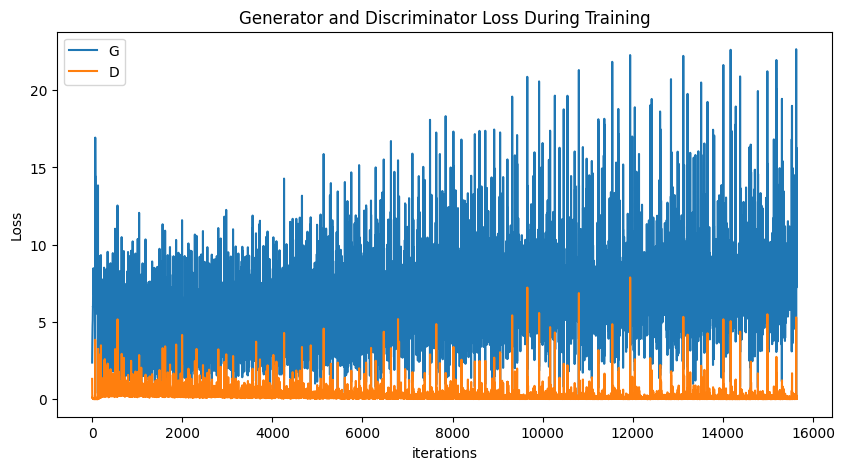

In [21]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

**Real Images vs. Fake Images**

Finally, lets take a look at some real images and fake images side by
side.


real


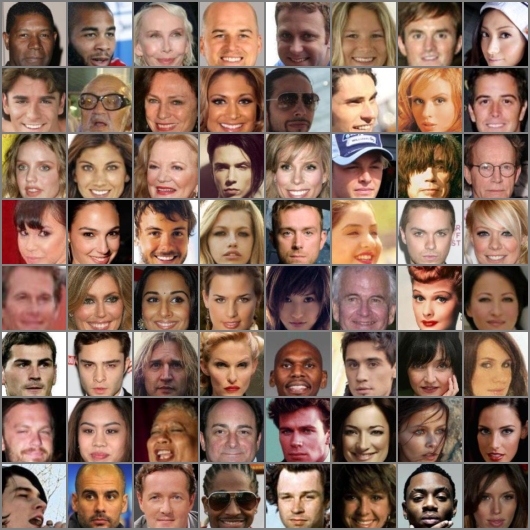

fake


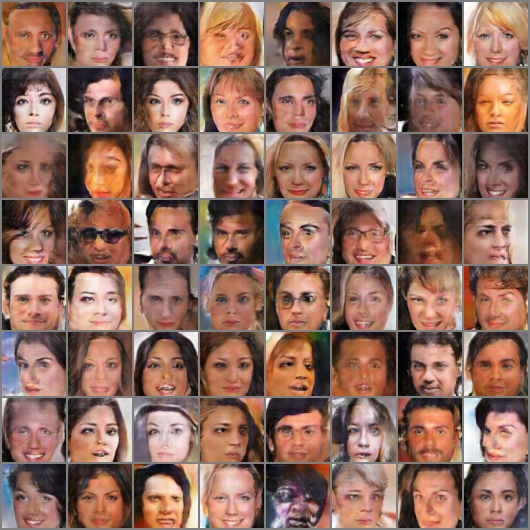

In [22]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))
print('real')
grid_real = make_grid(real_batch[0].clamp(-1,1), nrow = 8)
display(to_pil_image(grid_real.add(1).div(2)))

# a fixed batch of latent vectors to visualise the training progress
test_latents = torch.randn(64, z_dim, device=device)
generation = netG(test_latents)
print('fake')
grid_fake = make_grid(generation.clamp(-1,1), nrow = 8)
display(to_pil_image(grid_fake.add(1).div(2)))

## Interpolation

In [23]:
from utils import slerp
from base64 import b64encode

Create two random latent vector

In [24]:
latent_a = torch.randn(1, z_dim, device=device)
latent_b = torch.randn(1, z_dim, device=device)

we can use interpolation to create a smooth animation between our two latent vectors. We will be using the slerp (spherical latent interpolation) function in `util.py`.

100 latent vectors that transit from `latent_a` to `latent_b`

In [25]:
num_interp = 100

In [26]:
interp_vals = np.linspace(1./num_interp, 1, num=num_interp)

# Convert latent vectors to numpy arrays
latent_a_np = latent_a.cpu().numpy().squeeze()
latent_b_np = latent_b.cpu().numpy().squeeze()

# Create our spherical interpolation between two points
latent_interp = np.array([slerp(v, latent_a_np, latent_b_np) for v in interp_vals], dtype=np.float32)

Create a folder to store all generated images from the 100 latent vectors as image files.

In [27]:
# create a directory to save the images
if not os.path.exists('animation_frames_gan'):
    os.makedirs('animation_frames_gan')

Forward pass all latent vectors to the Generator

In [28]:
# Array for images to save to for visualisation
img_list = []

# For each latent vector in our interpolation
for i,latent in enumerate(latent_interp):
    # Convert to torch tensor
    latent = torch.tensor(latent).unsqueeze(0).to(device)
    # Generate image from latent
    image_tensor = netG(latent)
    # Convert to PIL Image
    image = transforms.functional.to_pil_image(image_tensor.clamp(-1,1).add(1).div(2).cpu().squeeze(0))
    image.save(f'./animation_frames_gan/{i:05}.jpg')
    # Add to image array
    img_list.append(image)

## Create a video using generated images as video frames  

We will need [FFMPEG](https://ffmpeg.org/) to do this:

#### Installing FFMPEG

If you want to make the gif animation using this code notebook you will need to install [ffmpeg](https://ffmpeg.org/download.html). We have already installed ffmpeg in week 4, so you should already have it. But if you don't, then you can follow these instructions:

To install FFMPEG on Mac:
- Step 1: [install homebrew](https://brew.sh/)
- Step 2: Run `brew install ffmpeg`

To install FFMPEG on Windows:
- Follow [these instructions](https://phoenixnap.com/kb/ffmpeg-windows) for Windows installation

To install FFMPEG on Ubuntu linux:
- Step 1: Run `sudo apt update`
- Step 2: Run `sudo apt install ffmpeg`

If you cannot install FFMPEG you can [make a gif manually using this website](https://ezgif.com/maker), or use other video editing softwares that can process frames into videos.


In [29]:
!ffmpeg -framerate 24 -i ./animation_frames_gan/%05d.jpg animation_frames_gan.mp4

ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

Display the video

In [30]:
mp4 = open('animation_frames_gan.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=200 controls loop>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

## Activities

Choose one of them to do:

**1. (Easy)** Try modifying the GAN or its training in at least one way that gives you a noticeable impact on the results. This can be done by changing some parameters in the **Inputs** section (e.g., the number of feature maps, the dimensionality of the latent vector, etc.). How does this impact on the results? What changes did you try that did not impact the results noticably?

**2. (Difficult)** Try increasing resolution of the training images. This can be done by changing the `image_resolution` parameter in the **Inputs** section. You may also need to add convolutional layer(s) in Generator and Discriminator classes in the **Implementation Generator and Discriminator** section.


**2. (More difficult)** Try training this GAN on a new dataset. You might try the full [CelebA](https://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset that contains over 200k images to get results with higher quality. Or, it would a great idea to grab other existing image datasets, such as [QuickDraw](https://quickdraw.withgoogle.com/data), Animal FacesHQ ([AFHQ](https://www.v7labs.com/open-datasets/afhq)), or other datasets from [https://www.kaggle.com/datasets?tags=13207-Computer+Vision](https://www.kaggle.com/datasets?tags=13207-Computer+Vision).